<a href="https://colab.research.google.com/github/jafr0822/MNA_ProyectoIntegrador-Equipo7/blob/main/Equipo7_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Proyecto Integrador
## Tecnológico de Monterrey
### Maestría en Inteligencia Artificial Aplicada (MNA)
#### Avance 1
#### Equipo 7
* Jorge Arturo Federico Rivera – A01250724
* Marco Antonio Vázquez Morales – A01793704
* Alejandro Jesús Vázquez Navarro - A01793146

Proyecto:

*Modelo clasificador de multimorbilidad maternal y predictor de desenlaces perinatales a partir de datos clínicos metabólicos, genéticos y nutricionales de mujeres mexicanas*

05 de mayo de 2024

Debido al número extenso de variables (99) generamos reportes estáticos en html para su mejor visualización.

Estos pueden consultarse en estas ligas:
- [Reporte mínimo exploratorio](https://github.com/jafr0822/MNA_ProyectoIntegrador-Equipo7/blob/8a9e4300831ede90791258bd5b58acd44c456537/data/reports/profile1_min_report.html)

- [Reporte completo exploratorio](https://github.com/jafr0822/MNA_ProyectoIntegrador-Equipo7/blob/8a9e4300831ede90791258bd5b58acd44c456537/data/reports/profile1_exp_report.html)

- [Reporte realizado con sweetViz](https://github.com/jafr0822/MNA_ProyectoIntegrador-Equipo7/blob/8a9e4300831ede90791258bd5b58acd44c456537/data/reports/sv_report1.html)


# Estructura de los datos:

A continuación se listan y describen los datos que serán utilizados para este proyecto:

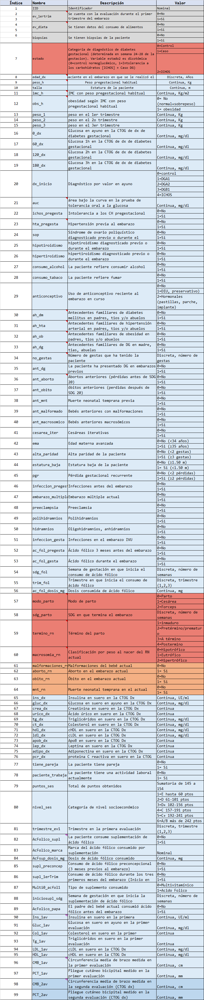

### Install libraries for Colab

In [19]:
# %pip install matplotlib-venn sweetviz ydata-profiling
# %pip install --upgrade Pillow

### Import libraries

In [38]:
import pandas as pd
import sweetviz as sv
import numpy as np
from ydata_profiling import ProfileReport

### Read data from Excel databases

#### base_multimorb_fase1_fase_2_clinicas_originales.xlsx

In [21]:
cols_to_include = [
    "id",
    "ev_1ertrim",
    "ev_dieta",
    "biopsias",
    "estado",
    "edad_dx",
    "peso_pg_h",
    "talla",
    "imc_h",
    "obs_h",
    "peso_1",
    "peso_2",
    "peso_3",
    "gluc_dx_0",
    "gluc_dx_60",
    "gluc_dx_120",
    "gluc_dx_180",
    "dx_inicio",
    "auc",
    "ichos_pregesta",
    "hta_pregesta",
    "sop",
    "hipotiroidismo",
    "hipertiroidismo",
    "consumo_alcohol",
    "consumo_tabaco",
    "anticonceptivo",
    "ah_dm",
    "ah_hta",
    "ah_ob",
    "ah_dg",
    "no_gestas",
    "ant_dg",
    "ant_aborto",
    "ant_obito",
    "ant_mnt",
    "ant_malformado",
    "ant_macrosomico",
    "cesarea_iter",
    "ema",
    "alta_paridad",
    "estatura_baja",
    "pgr",
    "infeccion_pregesta",
    "embarazo_multiple",
    "preeclampsia",
    "polihidramnios",
    "hidramnios",
    "infeccion_gesta",
    "ac_fol_pregesta",
    "ac_fol_gesta",
    "sdg_fol",
    "trim_fol",
    "ac_fol_dosis_mg",
    "modo_parto",
    "sdg_parto",
    "termino_rn",
    "macrosomia_rn",
    "malformaciones_rn",
    "aborto_rn",
    "obito_rn",
    "mnt_rn",
    "ins_dx",
    "gluc_dx",
    "crea_dx",
    "urico_dx",
    "tg_dx",
    "ct_dx",
    "hdl_dx",
    "ldl_dx",
    "apob_dx",
    "lep_dx",
    "adipo_dx",
    "pcr_dx",
    "tiene_pareja",
    "paciente_trabaja",
    "puntos_ses",
    "nivel_ses",
    "trimestre_ev1",
    "AcFolico_supl",
    "AcFolico_marca",
    "AcFsup_dosis_mg",
    "supl_preconcep",
    "supl_1erTrim",
    "Multi0_acfol1",
    "iniciosupl_sdg",
    "AcFolico_papa",
    "Ins_1av",
    "Gluc_1av",
    "Col_1av",
    "Tg_1av",
    "LDL_1av",
    "HDL_1av",
    "CMB_1av",
    "PCT_1av",
    "CMB_2av",
    "PCT_2av",
]

excel_file_1 = "data/base_multimorb_fase1_fase_2_clinicas_originales.xlsx"

df1_sheet1 = pd.read_excel(
    excel_file_1,
    sheet_name=0,
    usecols=cols_to_include,
)

df1_sheet2 = pd.read_excel(
    excel_file_1,
    sheet_name=1,
    usecols=cols_to_include,
)

df1_sheets = [
    df1_sheet1,
    df1_sheet2
]

df1 = pd.concat(df1_sheets)

df1.describe()

,ev_1ertrim,ev_dieta,biopsias,estado,edad_dx,peso_pg_h,talla,imc_h,obs_h,peso_1,...,AcFolico_papa,Ins_1av,Gluc_1av,Col_1av,Tg_1av,LDL_1av,HDL_1av,CMB_1av,CMB_2av,PCT_2av
count,1335.000000,1335.000000,1228.000000,1250.000000,1314.000000,1237.000000,1292.000000,1225.000000,1290.000000,610.000000,...,277.000000,29.000000,209.000000,209.000000,209.000000,207.000000,208.000000,211.000000,154.000000,154.000000
mean,0.158801,0.183521,0.084691,0.580800,30.909437,64.207672,1.562417,26.322959,0.193798,64.584393,...,0.050542,10.396552,85.119617,182.193301,147.655024,88.697585,60.486538,29.089573,28.700325,26.356818
std,0.369706,0.387238,0.278534,0.644208,6.832353,13.094585,0.061308,5.137912,0.395426,12.576272,...,0.219456,7.009967,6.647010,132.250206,55.816291,40.751169,18.224425,4.041969,4.155021,6.387703
min,0.000000,0.000000,0.000000,0.000000,15.000000,35.000000,1.250000,16.560653,0.000000,37.500000,...,0.000000,0.000000,68.000000,79.000000,52.000000,36.600000,31.000000,21.000000,3.500000,7.500000
25%,0.000000,0.000000,0.000000,0.000000,26.000000,55.000000,1.520000,22.826881,0.000000,55.825000,...,0.000000,6.400000,81.000000,151.000000,109.000000,68.000000,48.000000,26.400000,26.500000,22.500000
50%,0.000000,0.000000,0.000000,0.000000,32.000000,62.000000,1.560000,25.476660,0.000000,63.000000,...,0.000000,8.900000,84.000000,172.000000,143.000000,85.000000,57.000000,28.700000,29.000000,26.500000
75%,0.000000,0.000000,0.000000,1.000000,36.000000,70.000000,1.600000,28.959000,0.000000,71.650000,...,0.000000,12.600000,88.000000,194.000000,175.000000,102.500000,69.250000,31.500000,31.000000,30.500000
max,2.000000,1.000000,1.000000,2.000000,48.000000,140.000000,1.750000,60.595568,1.000000,119.000000,...,1.000000,32.600000,115.000000,1995.000000,349.000000,477.000000,137.000000,48.800000,39.000000,48.500000


In [22]:
df1.head(10)

,id,ev_1ertrim,ev_dieta,biopsias,estado,edad_dx,peso_pg_h,talla,imc_h,obs_h,...,Ins_1av,Gluc_1av,Col_1av,Tg_1av,LDL_1av,HDL_1av,CMB_1av,PCT_1av,CMB_2av,PCT_2av
0,GD01,0.0,0.0,0.0,1.0,32.0,55.0,1.59,21.755469,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,GD04,0.0,0.0,0.0,1.0,39.0,60.0,1.50,26.666667,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,GD05,0.0,0.0,0.0,1.0,37.0,85.0,1.61,32.791945,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,GD06,0.0,0.0,0.0,1.0,28.0,45.0,1.55,18.730489,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,GD07,0.0,0.0,0.0,1.0,40.0,82.0,1.55,34.131113,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,GD09,0.0,0.0,0.0,1.0,37.0,75.0,1.63,28.228386,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,GD010,0.0,0.0,0.0,1.0,40.0,80.0,1.64,29.744200,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,GD011,0.0,0.0,0.0,1.0,39.0,60.0,1.51,26.314635,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,GD012,0.0,0.0,0.0,1.0,26.0,49.0,1.51,21.490286,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,GD013,0.0,0.0,0.0,1.0,34.0,75.0,1.60,29.296875,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
df1.tail(10)

,id,ev_1ertrim,ev_dieta,biopsias,estado,edad_dx,peso_pg_h,talla,imc_h,obs_h,...,Ins_1av,Gluc_1av,Col_1av,Tg_1av,LDL_1av,HDL_1av,CMB_1av,PCT_1av,CMB_2av,PCT_2av
172,HG294,1.0,1.0,NaN,NaN,26.0,76.0,1.71,25.990903,0.0,...,NaN,88.0,221.0,273.0,107.4,59.0,29.1,30,NaN,NaN
173,HG295,1.0,1.0,NaN,NaN,39.0,70.0,1.58,28.040378,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,32.0,34.5,NaN,NaN
174,HG296,1.0,1.0,NaN,0.0,32.0,60.0,1.62,22.862369,0.0,...,NaN,70.0,266.0,69.0,99.2,53.0,28.0,18.75,NaN,NaN
175,HG297,1.0,1.0,NaN,NaN,37.0,64.0,1.65,23.507805,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,26.5,30.5,NaN,NaN
176,HG298,1.0,1.0,NaN,NaN,30.0,89.0,1.72,30.083829,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,36.5,37,NaN,NaN
177,HG299,1.0,1.0,NaN,NaN,25.0,45.0,1.51,19.735976,0.0,...,0.0,79.0,149.0,52.0,73.6,65.0,NaN,NaN,NaN,NaN
178,HG300,1.0,1.0,NaN,NaN,33.0,80.0,1.56,32.873110,1.0,...,0.0,92.0,204.0,109.0,119.2,63.0,32.0,42.5,NaN,NaN
179,HG301,1.0,1.0,NaN,0.0,26.0,62.0,1.56,25.476660,0.0,...,0.0,88.0,135.0,93.0,NaN,56.0,24.0,23,NaN,NaN
180,HG302,1.0,1.0,NaN,0.0,15.0,48.0,1.60,18.750000,0.0,...,NaN,88.0,132.4,66.9,NaN,NaN,23.5,22.5,NaN,NaN
181,HG303,1.0,1.0,NaN,NaN,21.0,54.0,1.72,18.253110,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,24.2,15.5,NaN,NaN


#### ydata-profiling

##### Generación de análisis univariado y bi/multivariado

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

KeyboardInterrupt: 

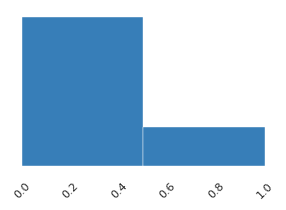

In [24]:
profile1 = ProfileReport(
    df1,
    title="Minimal Profiling Report for df1",
    # explorative=True,
    minimal=True,
)
profile1.to_file("data/reports/profile1_min_report.html")

In [ ]:
profile1.to_notebook_iframe()

### Debido al tamaño del reporte, se prefirió generar un archivo html llamado  profile1_exp_report.html que está alojado en el repositorio o puede ser consultado en la siguiente liga [EDA_Extensivo](/content/data/reports/profile1_min_report.html):

In [ ]:
profile1_exp = ProfileReport(
    df1,
    title="Explorative Profiling Report for df1",
    explorative=True,
    # minimal=True,
)
profile1_exp.to_file("https://github.com/jafr0822/MNA_ProyectoIntegrador-Equipo7/blob/8a9e4300831ede90791258bd5b58acd44c456537/data/reports/profile1_min_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/ydata_profiling/model/correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'cannot reindex on an axis with duplicate labels')
  warnings.warn(


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

##### sweetviz

In [ ]:
"""
    Posibles target_feat indicados:
        modo_parto
        sdg_parto
        termino_rn
        macrosomia_rn
"""

sv_df1 = df1.copy()

sv_df1 = sv_df1.astype(
    {
#         "registro": "str",
#         "fur": "str", # fecha
#         "fecha_encuesta": "str", # fecha
#         "fecha_muestra": "str", # fecha
#         "Fecha_ev1": "str", # fecha
        "AcFolico_marca": "str", # nombre
#         "f_encCTOG": "str", # fecha
#         "fecha_muestraCTOG": "str" # fecha
    },
    copy=False
)

cols_to_numeric = [
#     "sdg_dx",
#     "gluc_pp_60",
    "ant_macrosomico",
#     "sexo_rn",
#     "peso_rn",
#     "talla_rn",
#     "pc",
#     "capurro",
#     "apgar_1",
#     "apgar_5",
#     "pH_A",
#     "pO2_A",
#     "pCO2_A",
#     "pH_V",
#     "pO2_V",
#     "pCO2_V",
    "macrosomia_rn",
#     "percentil_peso",
#     "peso_placenta",
#     "ins_cordon_parto",
#     "e2_cordon_parto",
#     "lep_cordon_parto",
#     "adipo_cordon_parto",
#     "ins_pp",
#     "gluc_pp",
#     "crea_pp",
#     "urico_pp",
#     "tg_pp",
#     "ct_pp",
#     "hdl_pp",
#     "ldl_pp",
#     "apob_pp",
#     "lep_pp",
#     "adipo_pp",
#     "pcr_pp",
#     "pgn_pp",
#     "e2_pp",
#     "SDG_ev1",
#     "Folato_R24Hmcg",
#     "FFQ_FOLATOmcg",
#     "FFQ_DFE",
#     "FFQ_energia",
#     "AcFolico_supl",
    "AcFsup_dosis_mg",
    "PCT_1av",
#     "DFE_R24H2",
]

for col in cols_to_numeric:
    sv_df1[col] = pd.to_numeric(sv_df1[col], errors="coerce")

report1 = sv.analyze(
    sv_df1,
    # target_feat="termino_rn", # comentando porque hay que eliminar NA"s primero
    pairwise_analysis="on", # apagando porque sv se queja en modo auto
    # verbosity="progress_only", # no funciona todavía?
)

                                             |          | [  0%]   00:00 -> (? left)

In [ ]:
report1.show_html(
    filepath="data/reports/sv_report1.html",
    open_browser=False,
)

Report data/reports/sv_report1.html was generated.



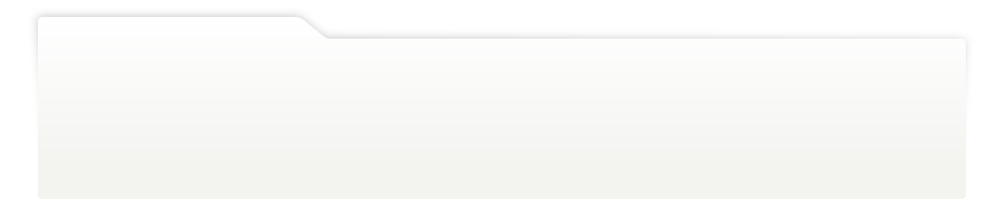
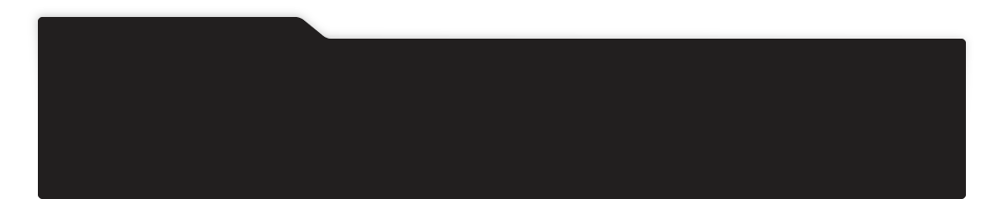
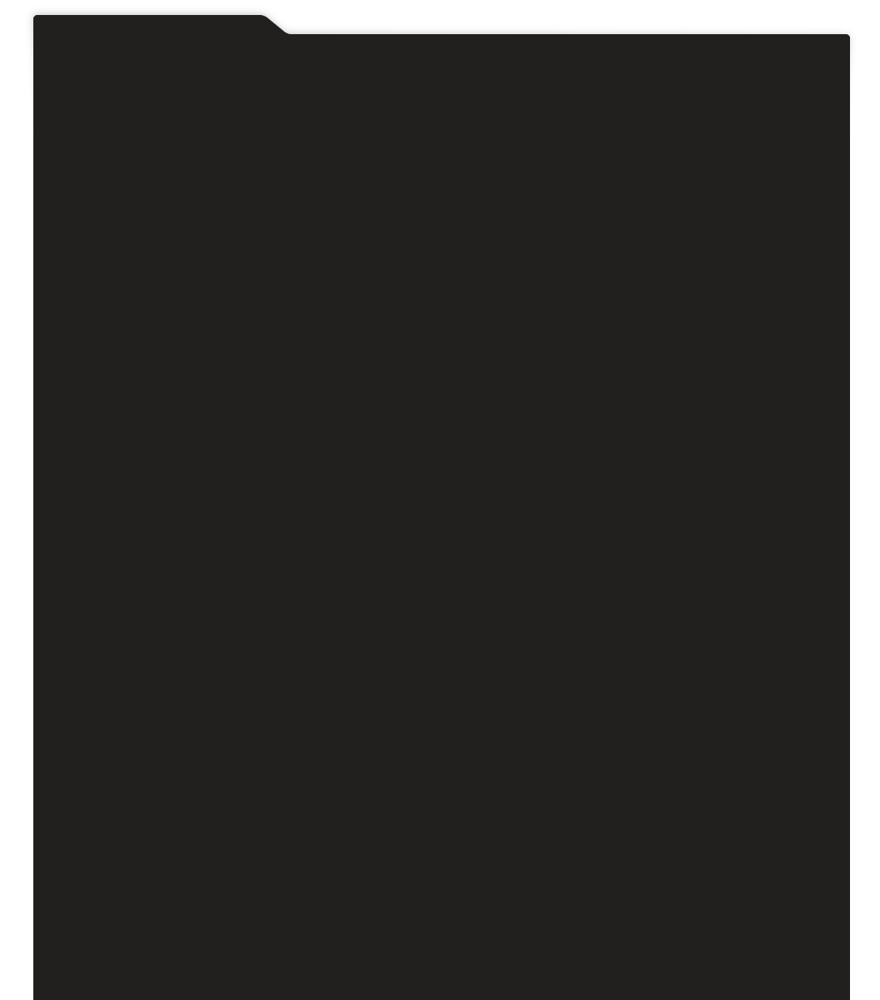
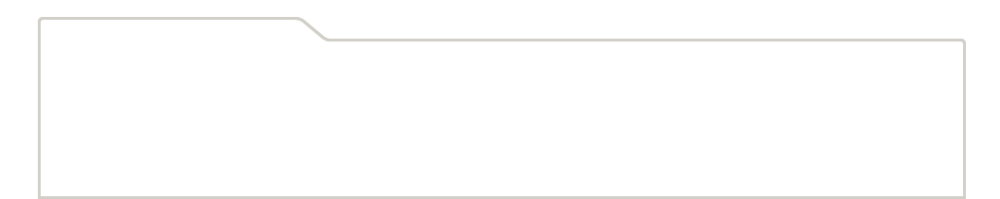
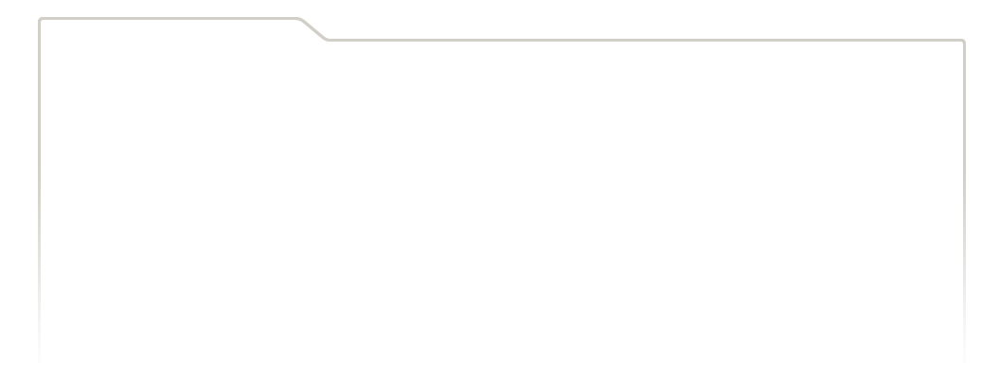
...
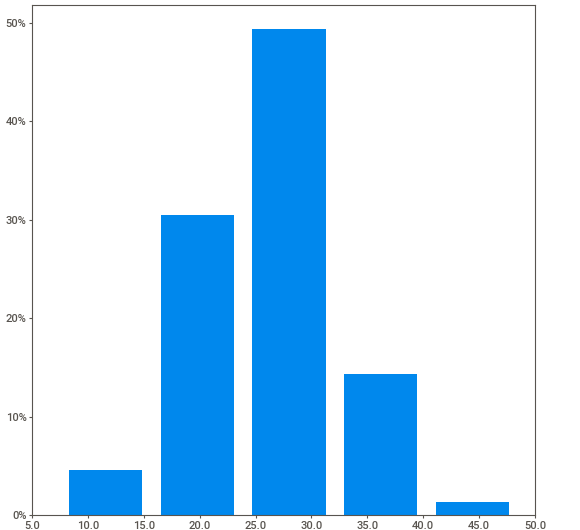
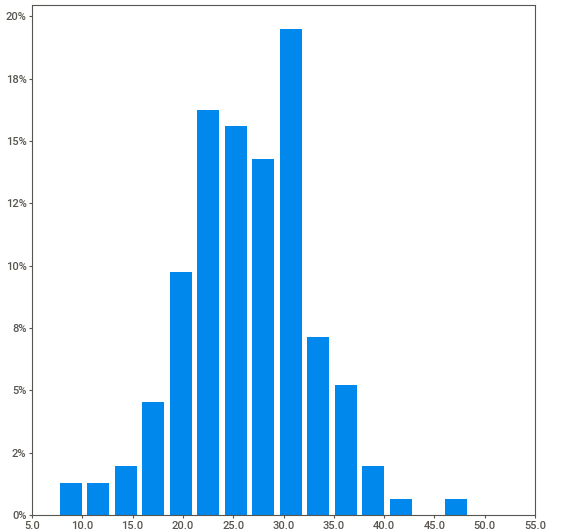
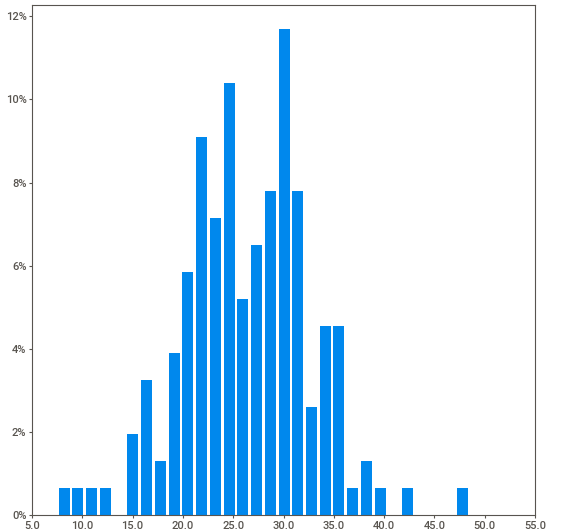
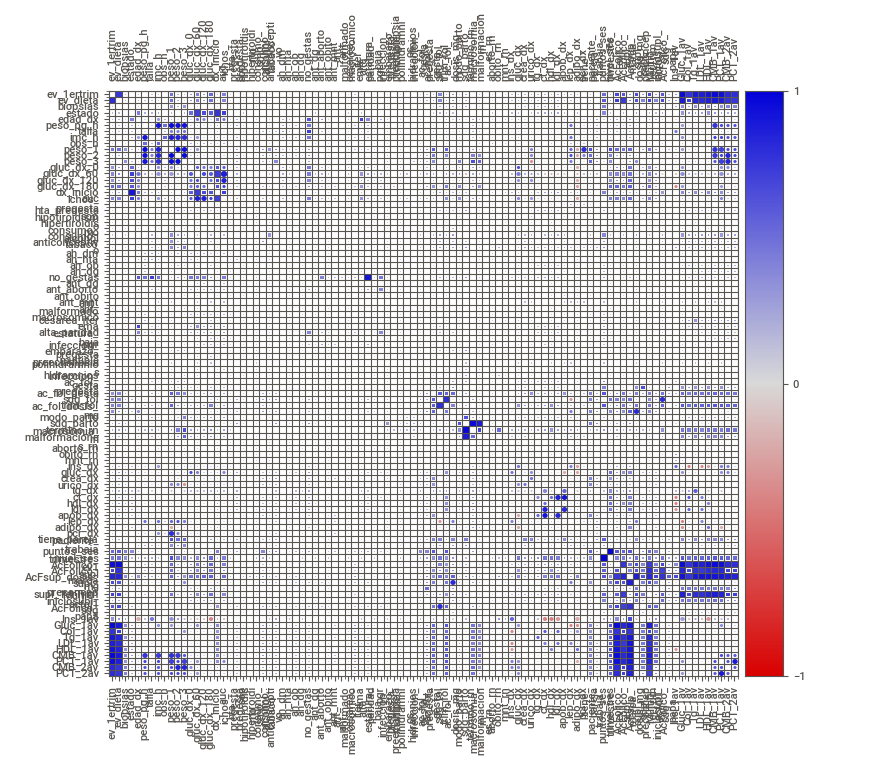
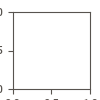

In [ ]:
report1.show_notebook()

/home/deck/Documents/School/Proyecto Integrador/Repositorio/MNA_ProyectoIntegrador-Equipo7/.venv/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


ValueError: could not convert string to float: '--'

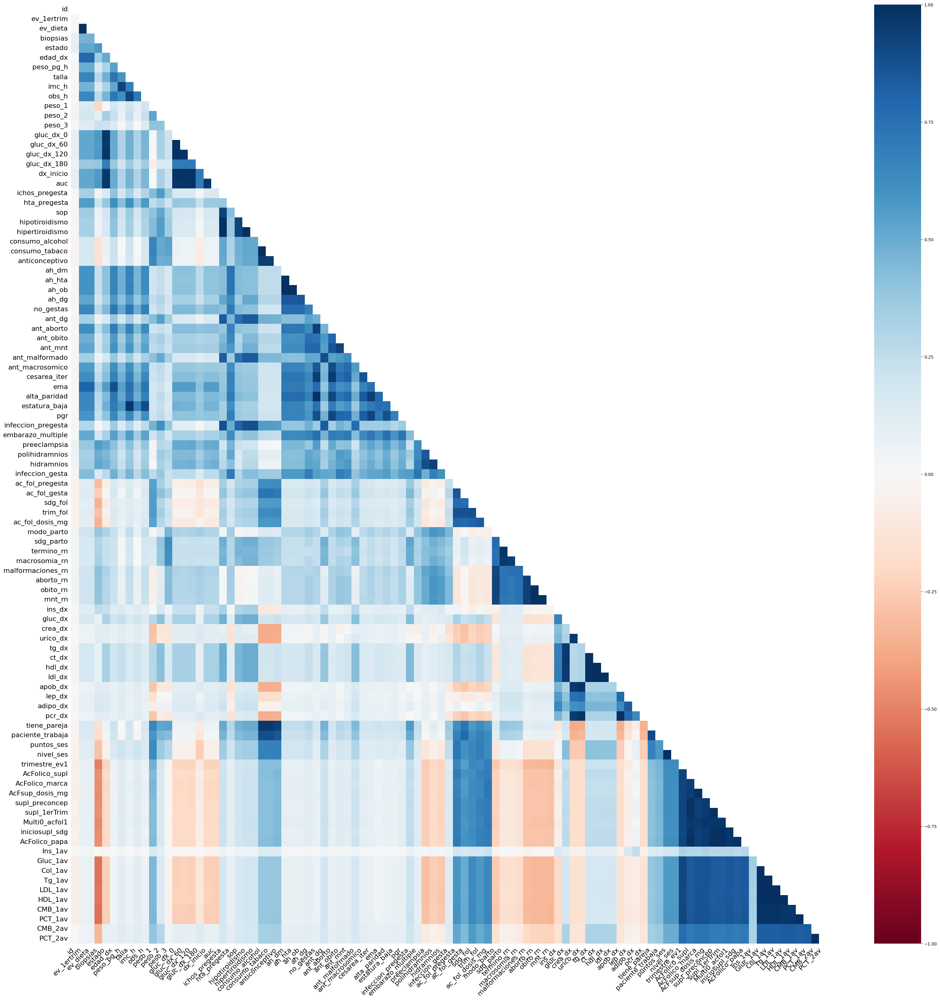

In [ ]:
# Missingness Map

import missingno as msno
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(40, 40))  # Adjust size as needed

# Create the heatmap
msno.heatmap(df1, ax=ax)

# Reduce font size of tick labels (optional)
ax.tick_params(axis='both', which='major', labelsize=10)  # Adjust size as needed

plt.show()

Esta gráfica nos permite identificar zonas de alta correlación con presencia y ausencia de variables.

Por ejemplo, la zona de variables ac_fol_pregesta, ac_fol_gesta, sdg_fol, trim_fol y ac_fol_dosis_mg tiene una ligera correlación positiva en presencia de biopsias.

Misma conducta podemos observarla con las variables trimestre_ev1, acFolico_supl, AcFolico_Marca, AcFsup_dosis_mg, supl_preconcep, supl_1erTrim, Multi0_acfol1, inicisupl_sdg, AcFolico_papa, Gluc_1av, Col_1av, Tg_1av, LDL_1av, HDL_1av, CMB_1av, PCT_1av.

También encontramos correlaciones positivas en presencia de datos con las siguientes pares de variables:

[trimestre_ev1, acFolico_supl, AcFolico_Marca, AcFsup_dosis_mg, supl_preconcep, supl_1erTrim, Multi0_acfol1, inicisupl_sdg, AcFolico_papa, Gluc_1av, Col_1av, Tg_1av, LDL_1av, HDL_1av, CMB_1av, PCT_1av]

<center>vs</center>

[modo_parto, sdg_parto, termino_rn (candidata a variable dependiente), macromosima_rn (candidata a variable dependiente), malformaciones_rn, aborto_rn, obito_rn, mnt_rn, ins_dx, crea_dx, urico_dx, aprob_dx, lep_dx, pcr_dx]

Estos últimos siendo parte del conjunto de marcadores bioquímicos.


# Dendrograma

Este gráfico proporciona información en forma de árbol generado mediante agrupación jerárquica y agrupa columnas que tienen fuertes correlaciones en nulidad.

Si varias columnas se agrupan en el nivel cero, esto significa que la presencia de nulos en una de esas columnas está directamente relacionada con la presencia o ausencia de nulos en las demás columnas. Cuanto más separadas estén las columnas en el árbol, menos probable será que los valores nulos estén correlacionados entre las columnas.



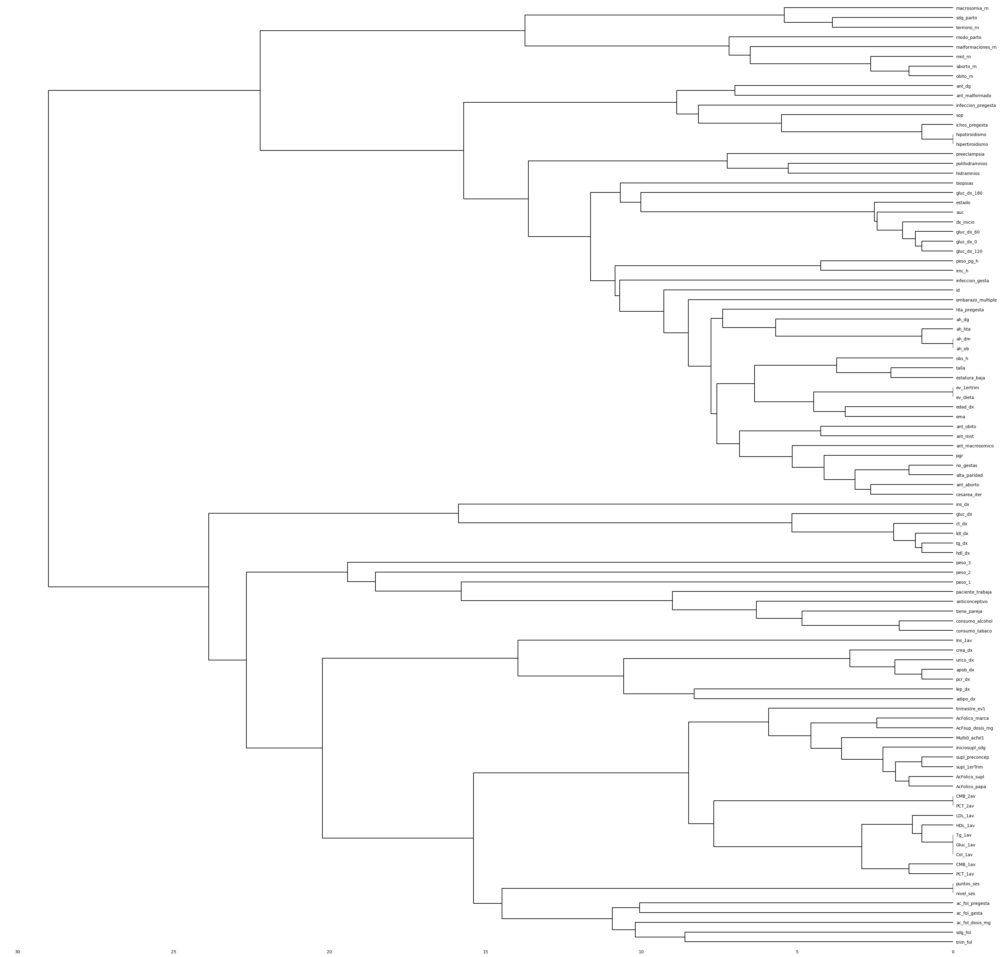

In [ ]:
fig, ax = plt.subplots(figsize=(40, 40))

msno.dendrogram(df1, ax=ax)

ax.tick_params(axis='both', which='major', labelsize=10)
plt.show()

Como se mencionó, este gráfico nos permite entender diferentes grupos de columnas que guardan relación con su presencia o no de datos. Por ejemplo, el grupo de preeclampsia, polihidramnios e hidramnios están fuertemente correlacionados en nulidad. La presencia de una variable en este grupo indica que existe una alta probabilidad de la existencia de otra.

Esto es importante porque gracias a esta gráfica podemos determinar grupos de variables y determinar qué técnica de imputación de datos podemos realizar. Es decir, todo lo que esté relacionado con la glucosa, puede ser tratado con la misma técnica de imputación.

Inclusive podemos identificar clusters de columnas a nivel cero como obs_h, talla, estatura_baja, ev_1ertrim, ev_dieta, edad_dx y ema que indican tener una gran densidad de dato.

# Preprocesamiento



Para las variables numéricas utilizaremos los siguientes criterios:

- En la siguiente fase del proyecto, realizaremos un análisis de componentes principales para reducir la multidimensionalidad. Esto nos permitirá reducir el número de componentes para nuestro modelo. Una vez que tengamos una matriz reducida de componentes, aplicaremos técnicas para determinar la naturaleza de los datos faltantes, es decir, si son faltas por MAR (Missing at Random), MCAR (Missing Completely at Random) o MNAR (Missing Not at Random)

- Dependiendo del diagnóstico que realicemos, aplicaremos técnicas de imputación simples (si es MAR),  eliminar completamente los registros (si es MCAR) o correr algoritmos de k-nn (podemos caer en sesgos pero es necesario evaluar)



#### Remover columnas con baja o nula correlación

Con base en una revisión hecha a partir de los reportes, gráficos y estadísticas previamente generados y mostrados o anexos a este notebook, se ha decidido en remover algunas de las columnas proporcionadas en la base de datos.

La principal justificación de la eliminación de estas columnas es su baja o nula correlación contra los _target features_ y por su alto número de valores faltantes (o NaN's) entre sus datos. De esta manera podremos reducir la cantidad de features presentes y será más fácil mantener el enfoque en las variables que serán mas valiosas para el análisis y modelo final. 

In [31]:
cols_to_remove = [
    "apob_dx",
    "lep_dx",
    "supl_preconcep",
    "Multi0_acfol1",
    "Ins_1av",
]

df1_minus_cols = df1.drop(columns=cols_to_remove)
df1_minus_cols.describe()

,ev_1ertrim,ev_dieta,biopsias,estado,edad_dx,peso_pg_h,talla,imc_h,obs_h,peso_1,...,iniciosupl_sdg,AcFolico_papa,Gluc_1av,Col_1av,Tg_1av,LDL_1av,HDL_1av,CMB_1av,CMB_2av,PCT_2av
count,1335.000000,1335.000000,1228.000000,1250.000000,1314.000000,1237.000000,1292.000000,1225.000000,1290.000000,610.000000,...,271.000000,277.000000,209.000000,209.000000,209.000000,207.000000,208.000000,211.000000,154.000000,154.000000
mean,0.158801,0.183521,0.084691,0.580800,30.909437,64.207672,1.562417,26.322959,0.193798,64.584393,...,4.834686,0.050542,85.119617,182.193301,147.655024,88.697585,60.486538,29.089573,28.700325,26.356818
std,0.369706,0.387238,0.278534,0.644208,6.832353,13.094585,0.061308,5.137912,0.395426,12.576272,...,4.217975,0.219456,6.647010,132.250206,55.816291,40.751169,18.224425,4.041969,4.155021,6.387703
min,0.000000,0.000000,0.000000,0.000000,15.000000,35.000000,1.250000,16.560653,0.000000,37.500000,...,0.000000,0.000000,68.000000,79.000000,52.000000,36.600000,31.000000,21.000000,3.500000,7.500000
25%,0.000000,0.000000,0.000000,0.000000,26.000000,55.000000,1.520000,22.826881,0.000000,55.825000,...,1.000000,0.000000,81.000000,151.000000,109.000000,68.000000,48.000000,26.400000,26.500000,22.500000
50%,0.000000,0.000000,0.000000,0.000000,32.000000,62.000000,1.560000,25.476660,0.000000,63.000000,...,4.000000,0.000000,84.000000,172.000000,143.000000,85.000000,57.000000,28.700000,29.000000,26.500000
75%,0.000000,0.000000,0.000000,1.000000,36.000000,70.000000,1.600000,28.959000,0.000000,71.650000,...,7.000000,0.000000,88.000000,194.000000,175.000000,102.500000,69.250000,31.500000,31.000000,30.500000
max,2.000000,1.000000,1.000000,2.000000,48.000000,140.000000,1.750000,60.595568,1.000000,119.000000,...,34.000000,1.000000,115.000000,1995.000000,349.000000,477.000000,137.000000,48.800000,39.000000,48.500000


#### Remover lineas con datos inválidos

In [42]:
# df1_minus_cols.set_index("id", inplace=True)

invalid_rows = [
    "HG066",
]

df1_minus_cols_no_invalid = df1_minus_cols.drop(index=invalid_rows)
df1_minus_cols_no_invalid.replace("Na", np.nan, inplace=True)

/tmp/ipykernel_2360/3514110602.py:8: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df1_minus_cols_no_invalid.replace("Na", np.nan, inplace=True)


#### Imputing and Encoding

In [44]:
df1_minus_cols_no_invalid.isna().sum()

ev_1ertrim      35
ev_dieta        35
biopsias       142
estado         120
edad_dx         56
              ... 
HDL_1av       1162
CMB_1av       1159
PCT_1av       1159
CMB_2av       1216
PCT_2av       1216
Length: 91, dtype: int64

In [64]:

BinaryList = [
    "ev_1ertrim",
    "ev_dieta",
    "biopsias",
    "obs_h",
    "ichos_pregesta",
    "hta_pregesta",
    "sop",
    "hipotiroidismo",
    "hipertiroidismo",
    "consumo_alcohol",
    "consumo_tabaco",
    "ah_dm",
    "ah_hta",
    "ah_ob",
    "ah_dg",
    "ant_dg",
    "ant_aborto",
    "ant_obito",
    "ant_mnt",
    "ant_malformado",
    "ant_macrosomico",
    "cesarea_iter",
    "ema",
    "alta_paridad",
    "estatura_baja",
    "pgr",
    "infeccion_pregesta",
    "embarazo_multiple",
    "preeclampsia",
    "polihidramnios",
    "hidramnios",
    "infeccion_gesta",
    "ac_fol_pregesta",
    "ac_fol_gesta",
    "tiene_pareja",
    "paciente_trabaja",
    "AcFolico_supl",
    # "supl_preconcep",
    "supl_1erTrim",
    # "Multi0_acfol1",
    "AcFolico_papa",
]

BinaryYList = [
    "malformaciones_rn",
    "aborto_rn",
    "obito_rn",
    "mnt_rn",
]

NumericList = [
    "edad_dx",
    "peso_pg_h",
    "talla",
    "imc_h",
    "peso_1",
    "peso_2",
    "peso_3",
    "gluc_dx_0",
    "gluc_dx_60",
    "gluc_dx_120",
    "gluc_dx_180",
    "auc",
    "no_gestas",
    "sdg_fol",
    "trim_fol",
    "ac_fol_dosis_mg",
    "sdg_parto",
    "ins_dx",
    "gluc_dx",
    "crea_dx",
    "urico_dx",
    "tg_dx",
    "ct_dx",
    "hdl_dx",
    "ldl_dx",
    # "apob_dx",
    # "lep_dx",
    "adipo_dx",
    "pcr_dx",
    "puntos_ses",
    "AcFsup_dosis_mg",
    "iniciosupl_sdg",
    # "Ins_1av",
    "Gluc_1av",
    "Col_1av",
    "Tg_1av",
    "LDL_1av",
    "HDL_1av",
    "CMB_1av",
    "PCT_1av",
    "CMB_2av",
    "PCT_2av",
]

NumericCategoricalList = [
    "estado",
    "dx_inicio",
    "anticonceptivo",
    "modo_parto",
    "termino_rn",
    "macrosomia_rn",
    "nivel_ses",
    "trimestre_ev1",
]

StringCategoricalList = [
    "AcFolico_marca",
    # "AcFolico_marca2",
]

MasterList = BinaryList + BinaryYList + NumericList + NumericCategoricalList + StringCategoricalList

remaining_columns = df1_minus_cols_no_invalid.columns.tolist()

missing_columns = list(set(remaining_columns) - set(MasterList))

missing_columns

[]

In [65]:
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import (
    OneHotEncoder,
    StandardScaler,
)
from sklearn.compose import ColumnTransformer


NumericPipeline = Pipeline(
    steps=[
        ("NumericInputter", SimpleImputer(strategy="median")),
        ('scaler', StandardScaler()),
    ]
)

NumericCategoricalPipeline = Pipeline(
    steps=[
        ("NumericalCategoricalInputter", SimpleImputer(strategy="most_frequent"))
    ]
)

StringCategoricalPipeline =  Pipeline(
    steps=[
        ("StringCategoricalInputter", SimpleImputer(missing_values=None,strategy="most_frequent")),
        ("CategoricalOneHotEncoder", OneHotEncoder(handle_unknown = "ignore"))
    ]
) 

BinaryColumnsPipeline = Pipeline(
    steps=[
        ("BinaryInputter", SimpleImputer(strategy="most_frequent"))
    ]
)

TransformColumns = ColumnTransformer(
    transformers = [
        ("Numerical", NumericPipeline, NumericList),
        ("NumericCategorical", NumericCategoricalPipeline, NumericCategoricalList),
        ("StringCategorical", StringCategoricalPipeline, StringCategoricalList),
        ("Binary", BinaryColumnsPipeline, BinaryList)
    ],
    remainder="passthrough"
)

df1_minus_cols_trans = TransformColumns.fit_transform(df1_minus_cols_no_invalid)

df1_minus_cols_trans

ValueError: Input contains NaN

# Conclusiones

Derivado de estos ejercicios, observamos que __________